In [42]:
import collections
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import matplotlib.transforms as mtrans
import matplotlib.patches as mpatches
import numpy as np
import pandas as pd
from skimage import exposure
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
import cv2
fontprops = fm.FontProperties(size=34)
from sklearn.neighbors import NearestNeighbors
from skimage import color, measure, filters
import seaborn as sns
from matplotlib.colors import ListedColormap
import os
import skimage
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from skimage import filters
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1 import ImageGrid

import matplotlib.gridspec as gridspec
from collections import defaultdict
from scipy.ndimage import distance_transform_edt
from matplotlib.patches import Rectangle
from collections import Counter


In [43]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [44]:
# Import path
module_path = str(Path.cwd().parents[0])
if module_path not in sys.path:
    sys.path.append(module_path)
    
module_path = str(Path.cwd().parents[0] / "src")
if module_path not in sys.path:
    sys.path.append(module_path)
    

In [45]:
from config import *
import my_io as io

# Read info 

In [46]:
directories = sorted([str(f) for f in data_tonsil.iterdir() if f.is_dir()])
datasets =  [name.split('\\')[-1] for name in directories]
print(datasets)

['DT1', 'DT2', 'DT3', 'DT4', 'DT5', 'DT6', 'NT1', 'NT2', 'NT3', 'NT4', 'NT5', 'NT6']


# Analysis

In [47]:
from skimage.measure import block_reduce

def tile_array(a, b0, b1):
    r, c = a.shape                                    # number of rows/columns
    rs, cs = a.strides                                # row/column strides 
    x = as_strided(a, (r, b0, c, b1), (rs, 0, cs, 0)) # view a as larger 4D array
    return x.reshape(r*b0, c*b1)                      # create new 2D array

def mean_block(img, block_size):
    img_reduced = block_reduce(img, block_size=block_size, func=np.mean)
#     img_reduced = (img_reduced - img_reduced.min())/(img_reduced.max() - img_reduced.min())
    img_reduced /= 255
    return img_reduced

def myround(x, base=5):
    return base * round(x/base)

def plot_mean(imgs_list, n, labels):
    patch_matrix = []
    for c in range(4):
        patch_matrix.append(mean_block(imgs_list[c], (n,n)))

    fig, axs = plt.subplots(2,2, figsize = (12,10))
    ax = axs.flatten()
    norm = plt.Normalize(vmin=np.min(patch_matrix),
                         vmax=np.max(patch_matrix))
    for c, ax in enumerate(ax):
        ax.axis('off')
        im = ax.imshow(patch_matrix[c], cmap = 'RdYlBu_r', norm=norm)
        ax.title.set_text(labels[c])
    fig.subplots_adjust(hspace=0.1, wspace=0.01)
    cbar = fig.colorbar(im, ax=axs, shrink=0.5)
    cbar.set_label('Intensity')
    plt.show()
    return patch_matrix

def plot_combined(imgs_list, n, int_min=0.2):
    patch_matrix = []
    for c in range(4):
        patch_matrix.append(mean_block(imgs_list[c], (n,n)))
    patch_matrix = np.array(patch_matrix)
    patch_max = np.argmax(patch_matrix, axis=(0))
    patch_max = np.where(np.all(patch_matrix < int_min, axis=0), np.nan, patch_max)
    
    rgb = np.array([[255,51,255], [51,255,51], [0,0,255], [255,204,51]])/255
#     rgb = np.array([[255,0,255], [0,255,0], [0,255,255], [255,255,0]])/255
    cmap = ListedColormap(rgb)
                   
    fig, ax = plt.subplots(figsize = (10,10))
    ax.imshow(patch_max, cmap=cmap, vmin=0, vmax=3, interpolation='none')
    ax.set_facecolor('black')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    return patch_max

In [48]:
marker_list = [['Pankeratin'], ['CD68'],['CD8a'], ['Col1', 'SMA']]
labels = ['PanK', 'CD68', 'CD8a', 'Col1+SMA']

In [49]:
def get_proportion(patch_max, n):
    img_size = patch_max.shape[0] * patch_max.shape[1]
    P = np.count_nonzero(patch_max == n) / img_size
    return P

def get_label_img(patch_max, n):
    labels = measure.label(patch_max == n, background=0, connectivity=2)
    return labels

def get_contour(labeled_img, n = 2):
    labels = np.unique(labeled_img)[1:]
    contours = []

    for label in labels:
        mask_label = (labeled_img == label)
        mask_label = ~mask_label
        distances = distance_transform_edt(mask_label)
        contour = np.where(np.logical_and(distances>=1, distances<n), 1, 0)
        row, col = np.where(contour > 0)
        contours.append(np.array(list(zip(row, col))))
        
    return labels, contours

def get_neighbor_env(img_labeled, patch_max, n_size=2, show=True):
    props = measure.regionprops(img_labeled)
    areas = []
    labels = []
    counts = []
    bboxs = []
    for prop in props:
        if prop['area'] > 1:
            bbox = np.asarray(prop['bbox'])
            bbox += np.array([-n_size, -n_size , n_size , n_size])
            bbox = np.clip(bbox, a_min = 0, a_max = None)
            row_min, col_min, row_max, col_max = bbox

            patch_max_roi = patch_max[row_min: row_max, col_min:col_max]
            size = patch_max_roi.size
            patch_max_roi = patch_max_roi[~np.isnan(patch_max_roi)].astype(int)
            count = Counter(patch_max_roi[~np.isnan(patch_max_roi)])   
            count = {k:v/size for k,v in count.items()}
            counts.append(count)
            areas.append(prop['area'])
            labels.append(prop['label'])
            bboxs.append(bbox)


    if show:
        rgb = np.array([[255,51,255], [51,255,51], [0,0,255], [255,204,51]])/255
        cmap = ListedColormap(rgb)
        fig, ax = plt.subplots( figsize=(10,10))
        ax.imshow(patch_max, cmap=cmap, vmin=0, vmax=3, interpolation='none')
        ax.set_facecolor('black')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        for bbox in bboxs:
            row_min, col_min, row_max, col_max = bbox
            ax.add_patch(Rectangle((col_min-1, row_min-1), col_max-col_min+1, row_max-row_min+1, fill=None, alpha=1, edgecolor='b', lw=2))
    return counts, areas, labels, bboxs

def get_contour_env(img_labeled, contours, patch_max, show=True):
    if show:
        mask = np.zeros(img_labeled.shape)*np.nan
        for contour in contours:
            mask[contour[:, 0], contour[:, 1]] = 1
        fig, ax = plt.subplots(figsize=(10,10))
        ax.imshow(mask, cmap='hsv')
        ax.imshow(np.where(img_labeled == 0, np.nan, 0), cmap='Pastel2')
        ax.axis('off')
    
    counts = []
    for contour in contours:
        env = patch_max[contour[:,0], contour[:,1]]
        size = len(env)
        count = Counter(env[~np.isnan(env)].astype(int))   
        count = {k:v/size for k,v in count.items()}
        counts.append(count)
        
    return counts

def get_interaction(counts):
    tumor_int = []
    stroma_int = []
    ip_int = []
    in_int = []

    for count in counts:
        tumor_int.append(count.get(0, 0.))
        in_int.append(count.get(1, 0.))
        ip_int.append(count.get(2, 0.))
        stroma_int.append(count.get(3, 0.))

    tumor_int = np.mean(tumor_int)
    stroma_int = np.mean(stroma_int)
    ip_int = np.mean(ip_int)
    in_int = np.mean(in_int)

    return tumor_int, stroma_int, ip_int, in_int



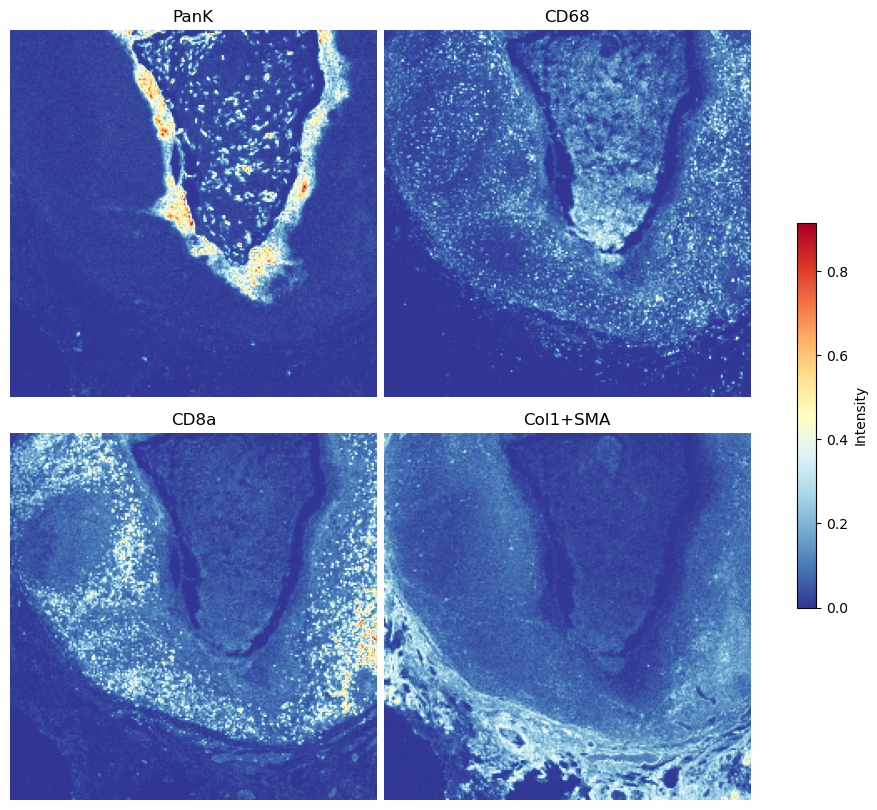

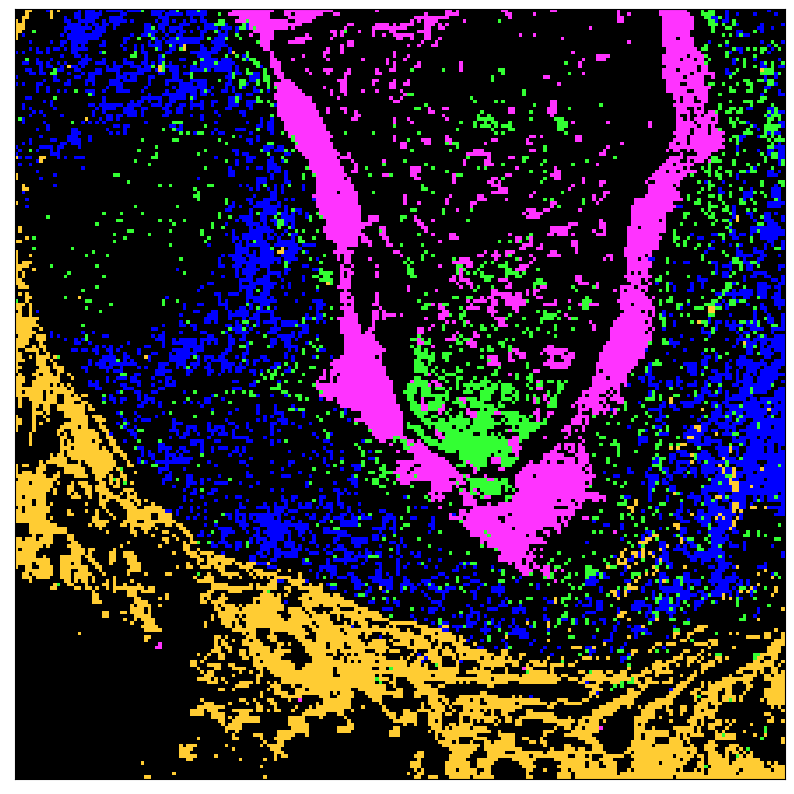

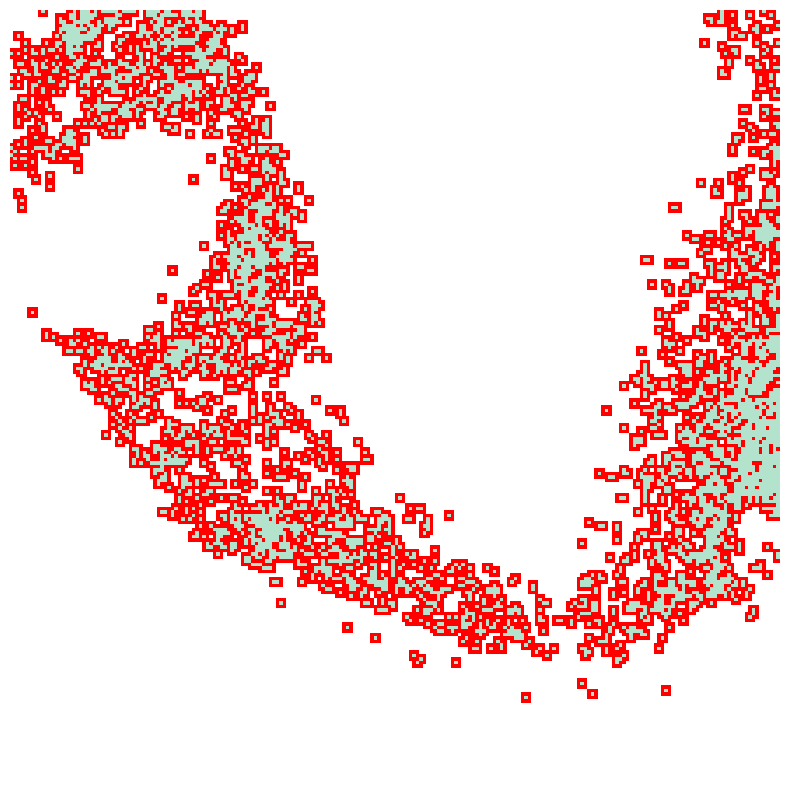

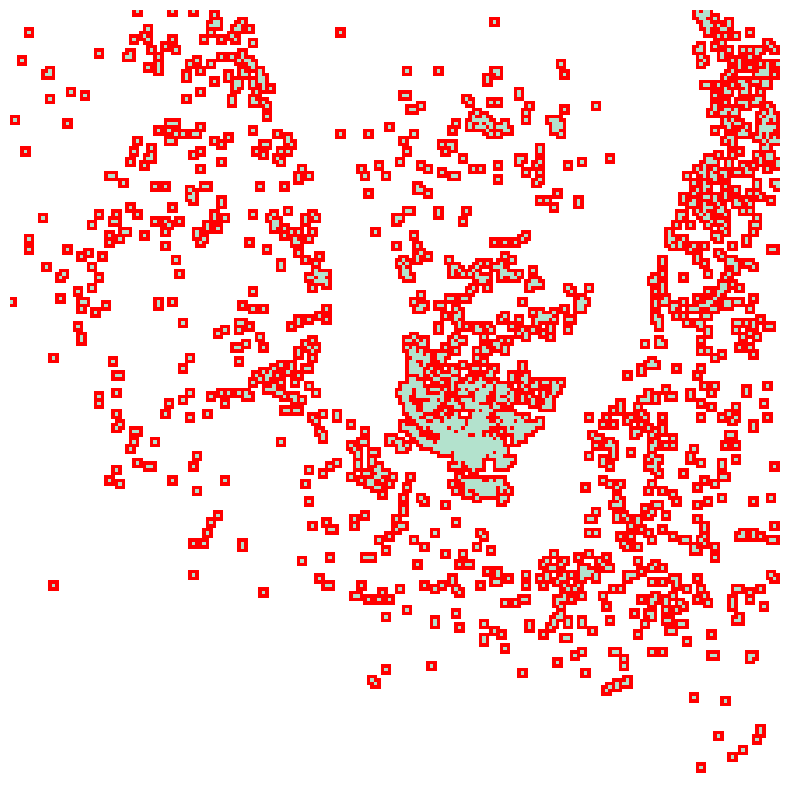

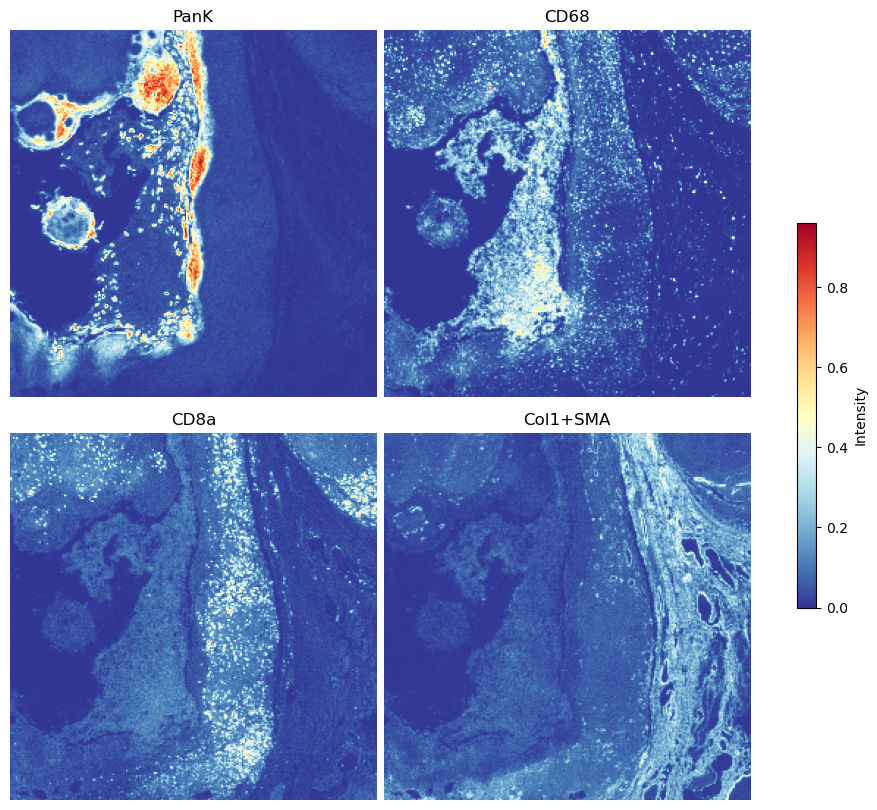

...

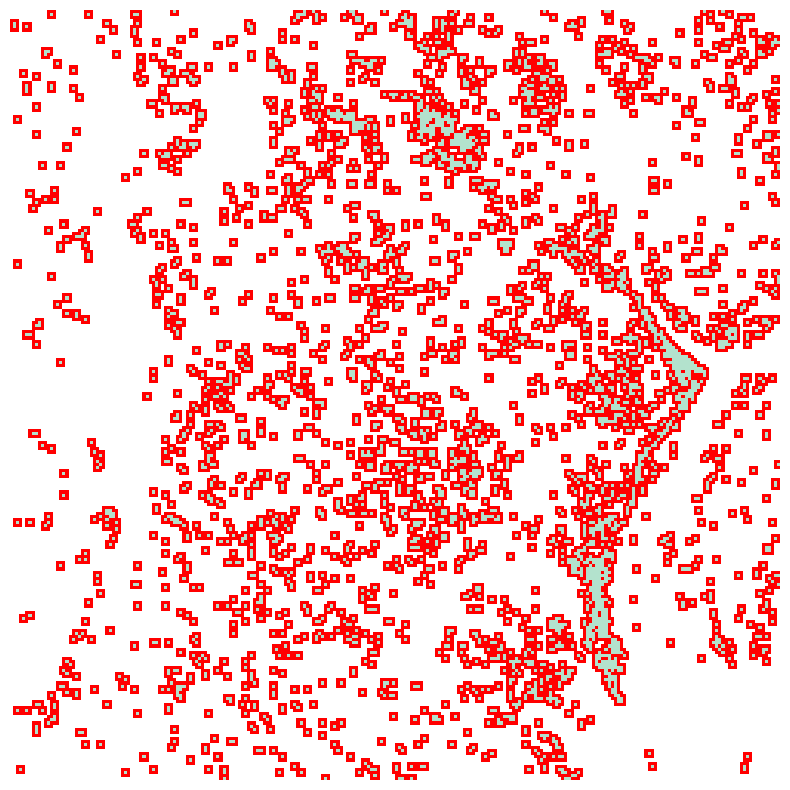

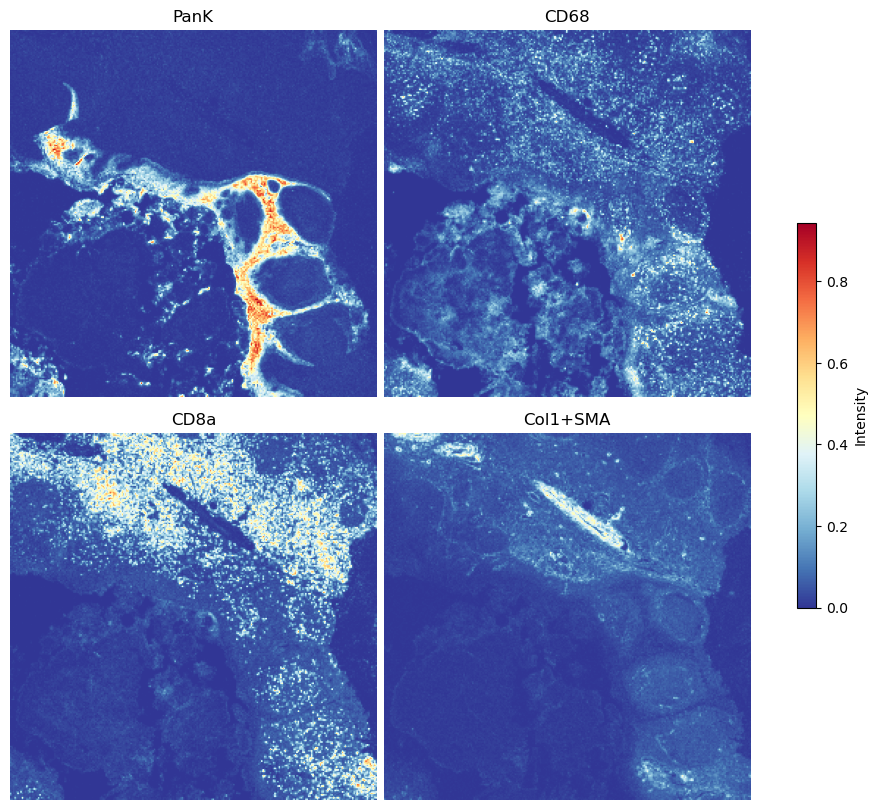

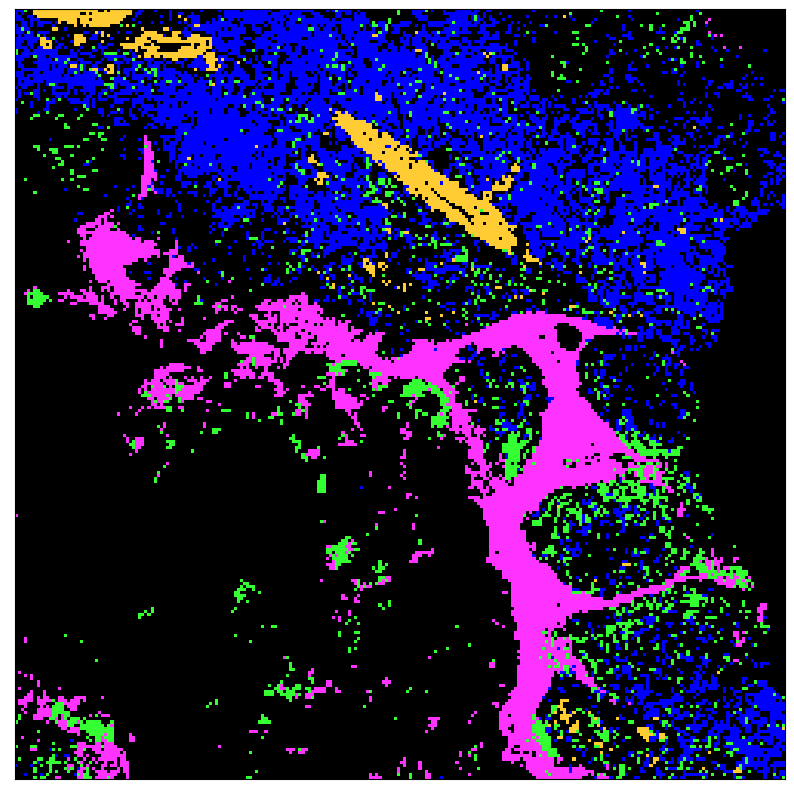

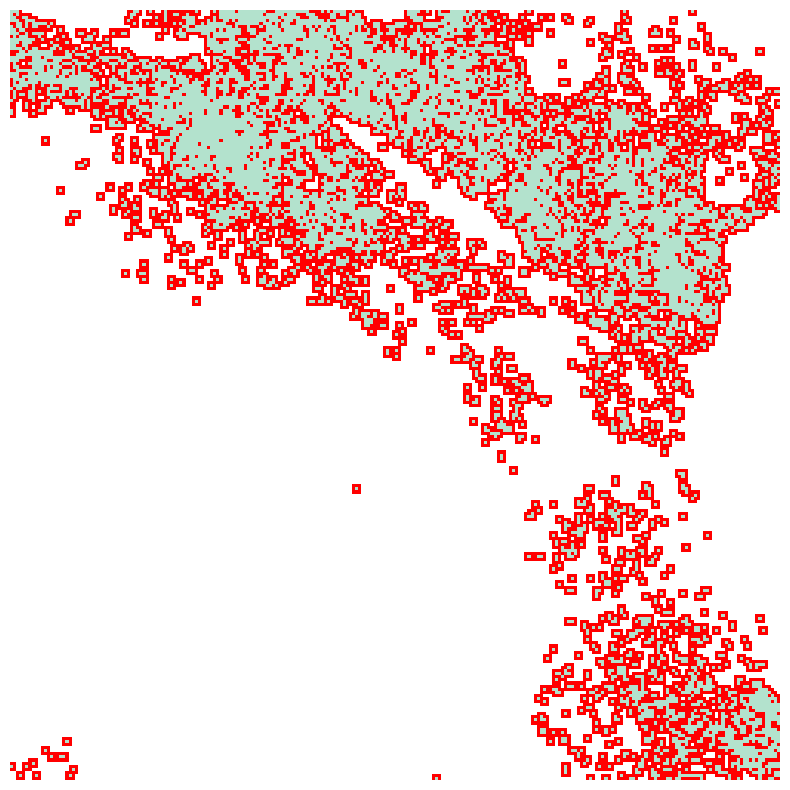

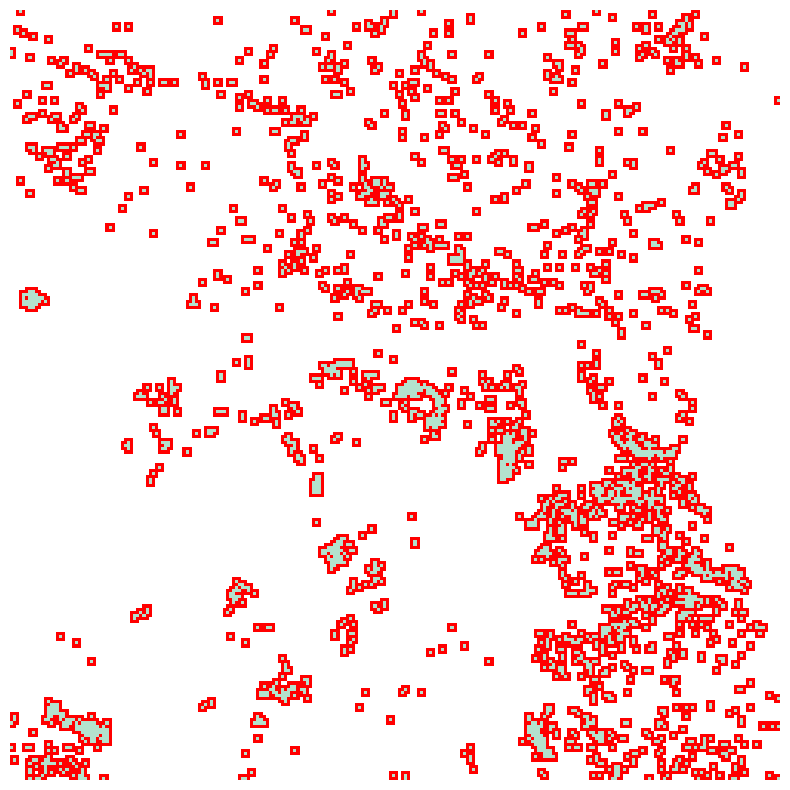

In [50]:
from skimage.restoration import denoise_bilateral

n = 10
scores = defaultdict(list)

for dataset in datasets:

    # Read image and cell_mask
    imgs, markers = io.read_img(dataset, data_tonsil)
    marker2img = dict(zip(markers, imgs))
    min_shape = min(imgs[0].shape[0], imgs[0].shape[1])
    min_shape = myround(min_shape, base=n)
    imgs_list = []
    for markers in marker_list:
        temp = []
        for marker in markers:
            img = marker2img[marker]
            p2, p98 = np.percentile(img, (75., 100.))
            img = exposure.rescale_intensity(img, in_range=(p2, p98))
            temp.append(img[:min_shape, :min_shape])
        imgs_list.append(np.array(np.mean(temp, axis=(0))))

    # Grayscale backgroun image
    data = np.stack(imgs_list, axis=2)[:min_shape, :min_shape]
    
    # Pixel
    patch_matrix = plot_mean(imgs_list, n, labels)
    patch_max = plot_combined(imgs_list, n)
    
    scores['Tumor'].append(get_proportion(patch_max, 0))
    IN_prop = get_proportion(patch_max, 1)
    scores['IN'].append(IN_prop)
    IP_prop = get_proportion(patch_max, 2)
    scores['IP'].append(IP_prop)
    scores['Stroma'].append(get_proportion(patch_max, 3))
    
    IN_labels = get_label_img(patch_max, 1)
    IP_labels = get_label_img(patch_max, 2)
    
    # Immune positif
    _, contours = get_contour(IP_labels, n=2)
    counts = get_contour_env(IP_labels, contours, patch_max)
    tumor_int, stroma_int, ip_int, in_int = get_interaction(counts)
    
    scores['IP_T'].append(tumor_int*IP_prop)
    scores['IP_S'].append(stroma_int*IP_prop)
    scores['IP_IN'].append(in_int*IP_prop)
    
    # Immune negatif
    _, contours = get_contour(IN_labels, n=2)
    counts = get_contour_env(IN_labels, contours, patch_max)
    tumor_int, stroma_int, ip_int, in_int = get_interaction(counts)

    scores['IN_T'].append(tumor_int*IN_prop)
    scores['IN_S'].append(stroma_int*IN_prop)
    scores['IN_IP'].append(ip_int*IN_prop)
    
    plt.show()